In [ ]:
!pip install open_clip_torch
!pip install pyinaturalist
!pip install captum
!pip install pybioclip
!pip install scikit-image
!pip install matplotlib
!pip install scipy
!pip install torchcam



/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Added new species 'Cicindela hirticollis' to index.
https://www.inaturalist.org/observations/235798049
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Cicindela hirticollis
BioCLIP family:    Carabidae


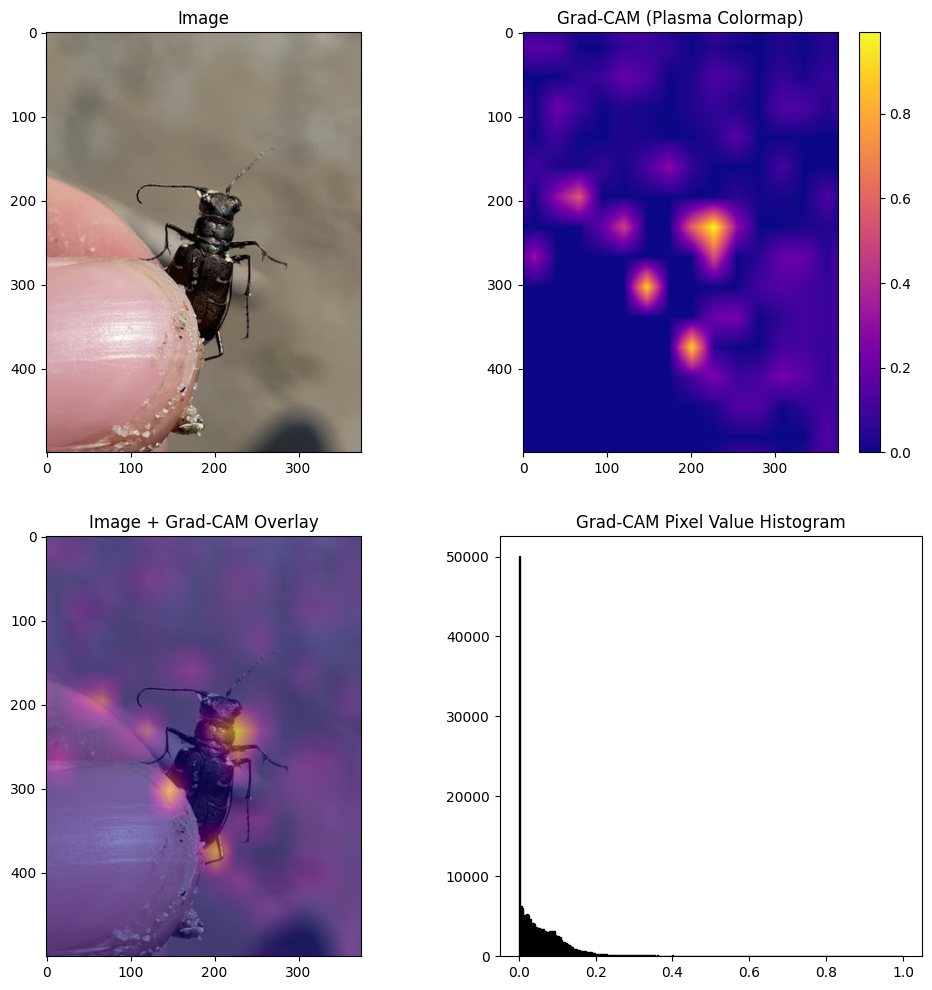



Added new species 'Cylindera confluentesignata' to index.
https://www.inaturalist.org/observations/235791284
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Cylindera confluentesignata
BioCLIP family:    Carabidae


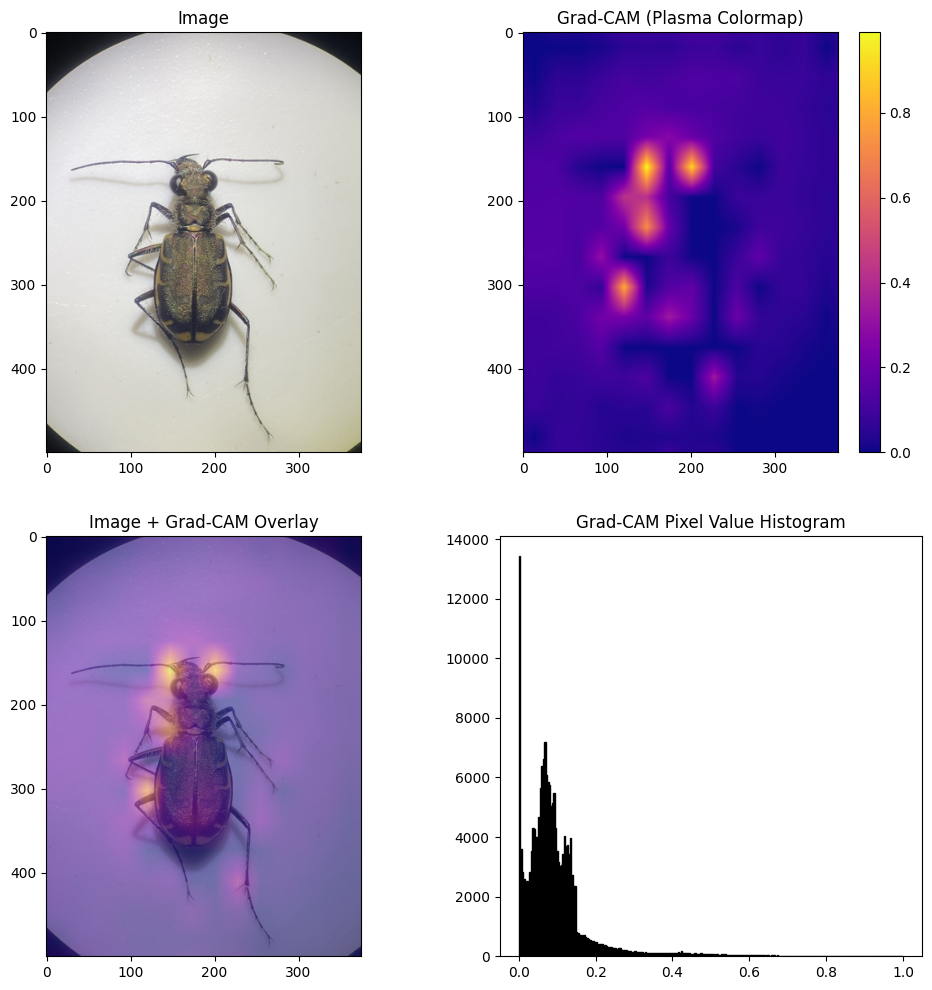



Added new species 'Cicindela duodecimguttata' to index.
https://www.inaturalist.org/observations/235789695
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Cicindela duodecimguttata
BioCLIP family:    Carabidae


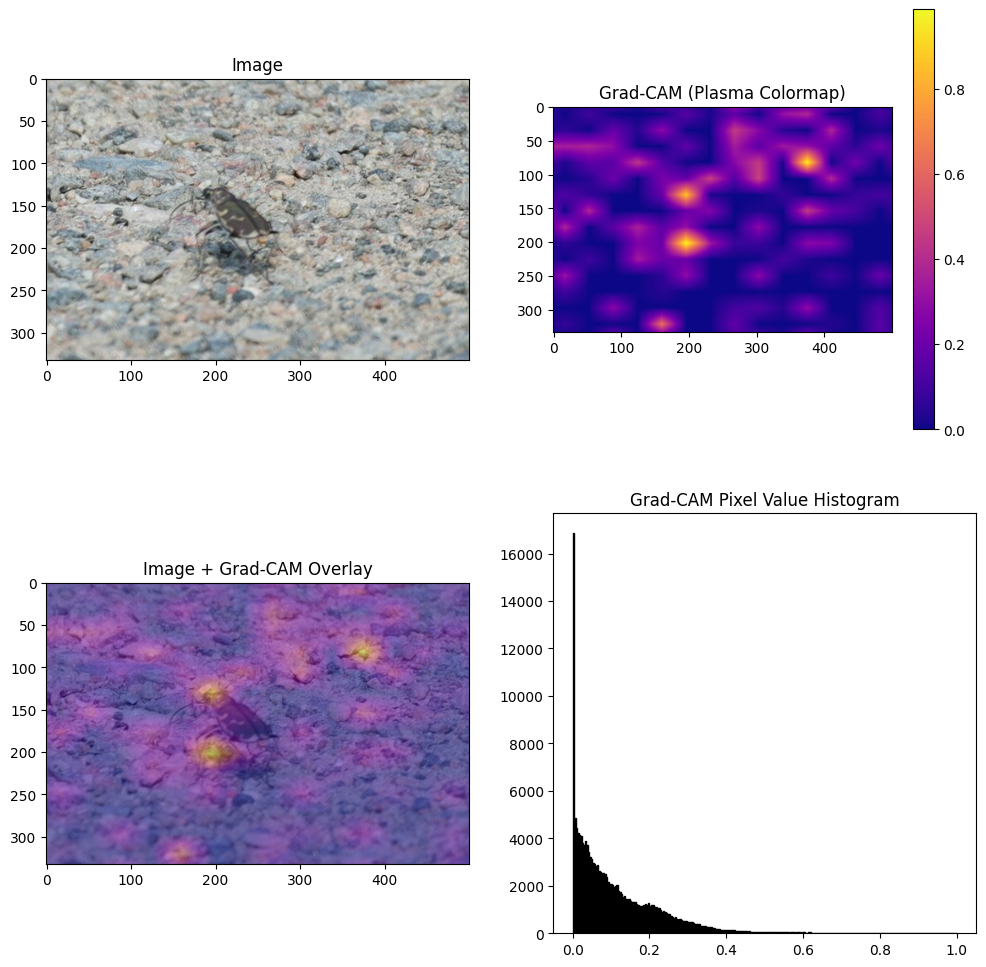



Added new species 'Cylindera arenaria' to index.
https://www.inaturalist.org/observations/235788391
iNaturalist taxon: Cicindela repanda repanda
BioCLIP species:   Cylindera arenaria
BioCLIP family:    Carabidae


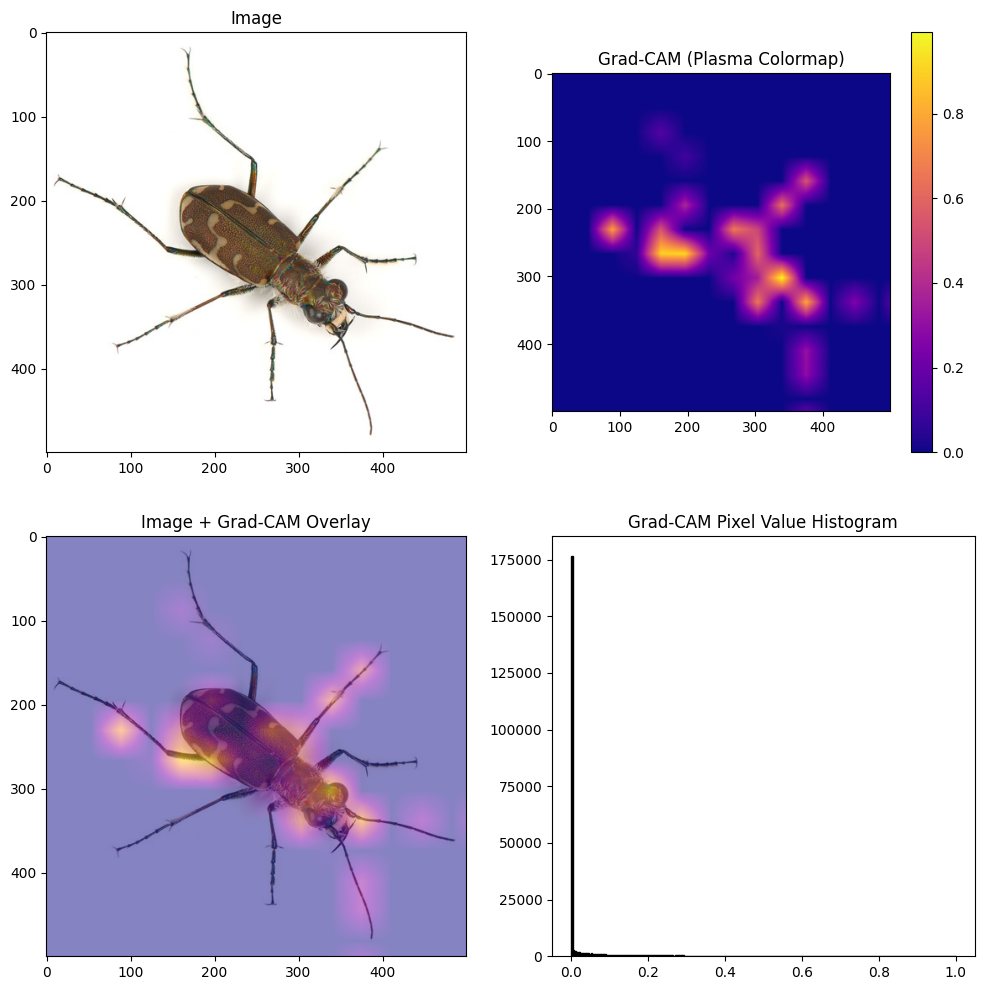



Added new species 'Cicindela favergeri' to index.
https://www.inaturalist.org/observations/235787935
iNaturalist taxon: Cicindela repanda repanda
BioCLIP species:   Cicindela favergeri
BioCLIP family:    Carabidae


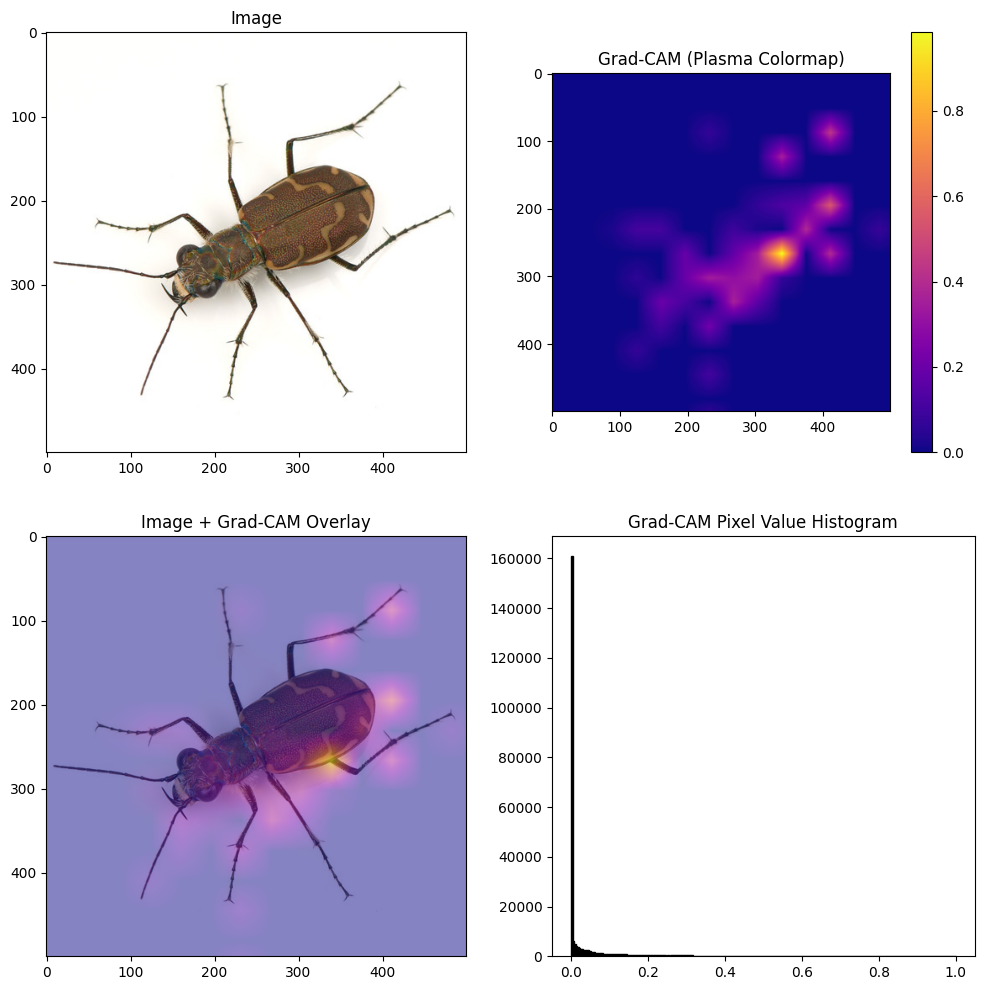



https://www.inaturalist.org/observations/235774892
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Cicindela hirticollis
BioCLIP family:    Carabidae


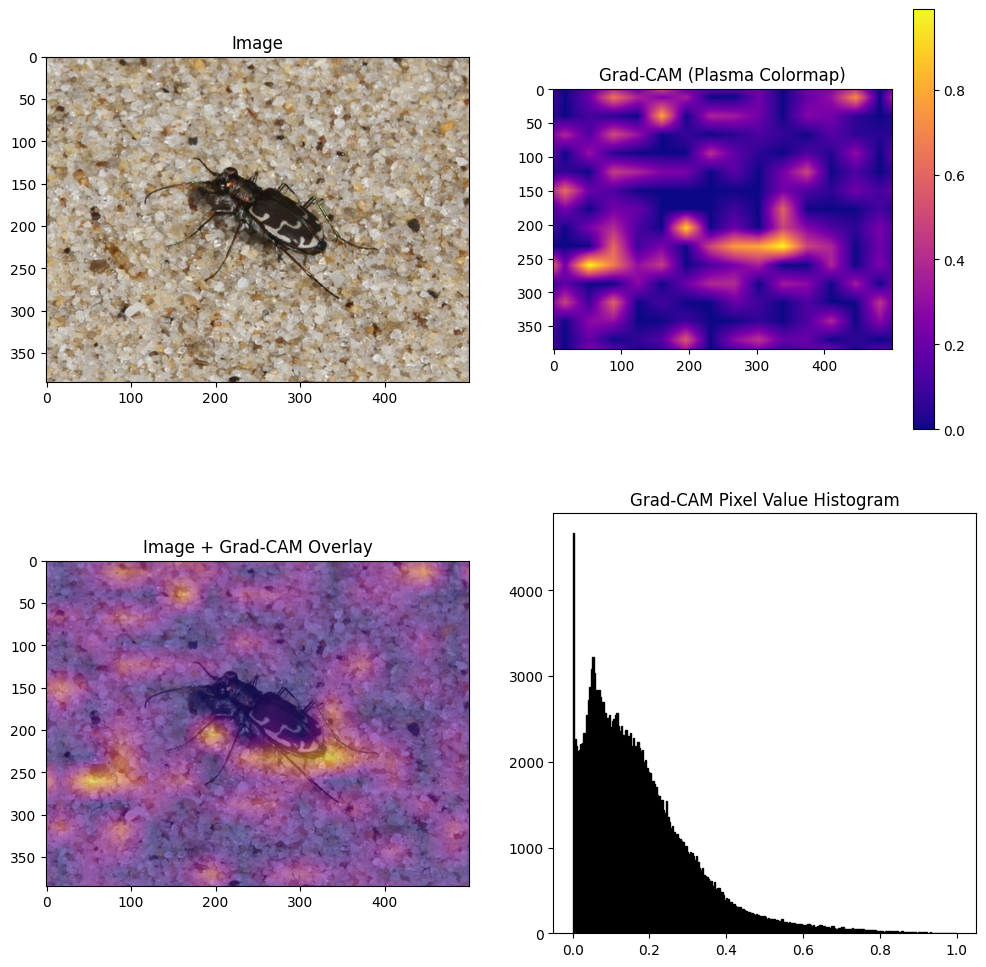



https://www.inaturalist.org/observations/235752392
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Cicindela duodecimguttata
BioCLIP family:    Carabidae


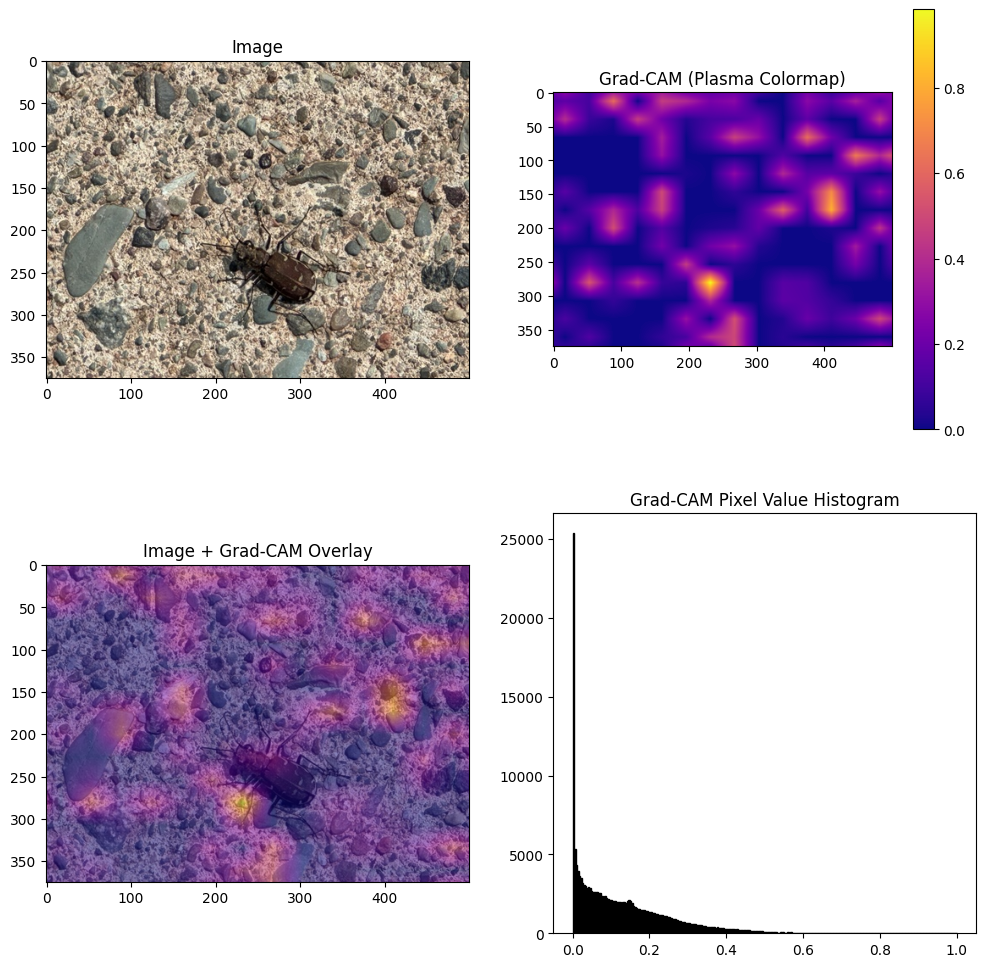



Added new species 'Cicindela repanda' to index.
https://www.inaturalist.org/observations/235730706
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Cicindela repanda
BioCLIP family:    Carabidae


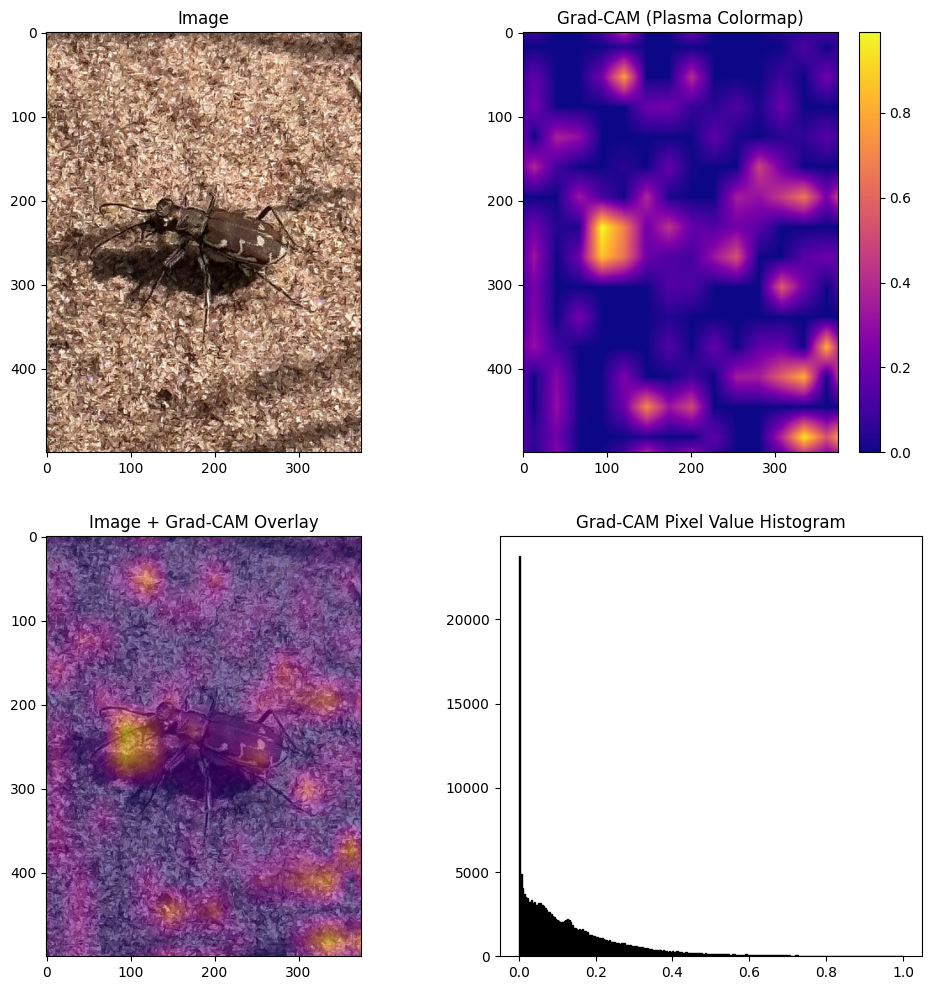



https://www.inaturalist.org/observations/235654606
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Cicindela repanda
BioCLIP family:    Carabidae


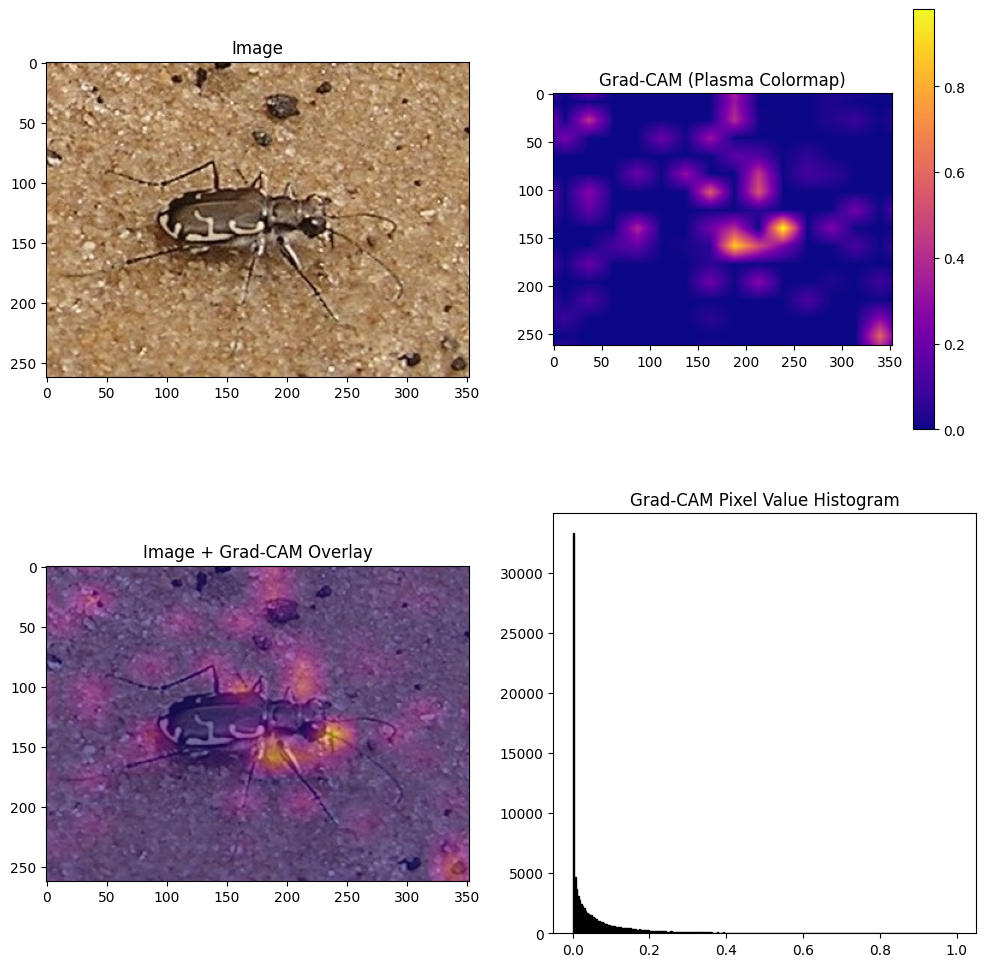



Added new species 'Cicindela hybrida' to index.
https://www.inaturalist.org/observations/235607791
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Cicindela hybrida
BioCLIP family:    Carabidae


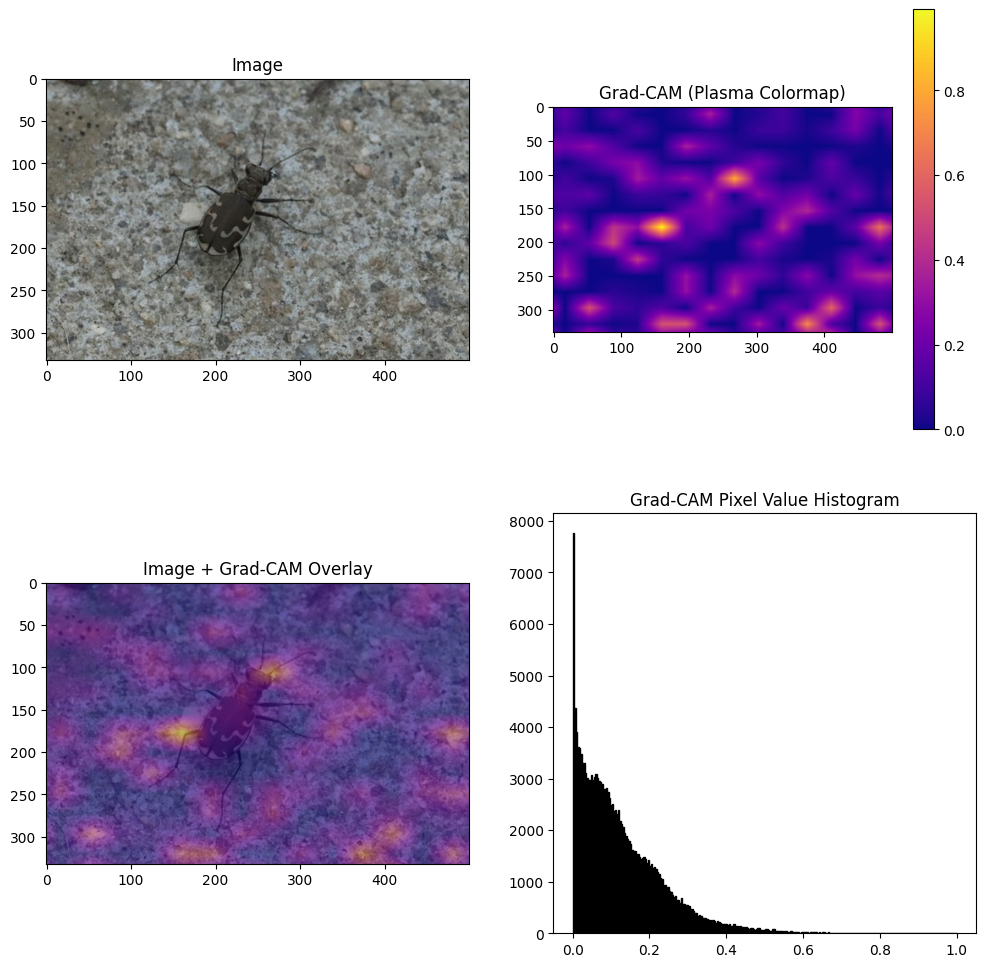



Added new species 'Cicindela tranquebarica' to index.
https://www.inaturalist.org/observations/235571527
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Cicindela tranquebarica
BioCLIP family:    Carabidae


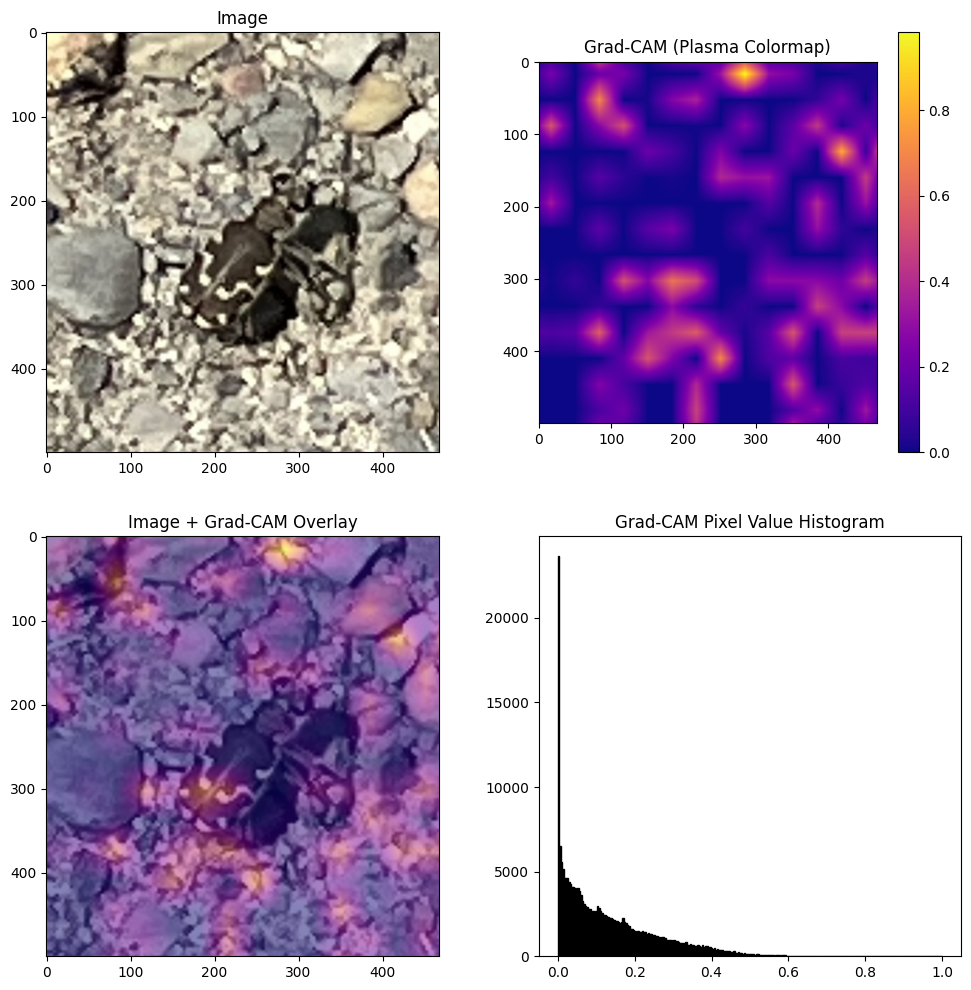



Added new species 'Cylindera nivea' to index.
https://www.inaturalist.org/observations/235536134
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Cylindera nivea
BioCLIP family:    Carabidae


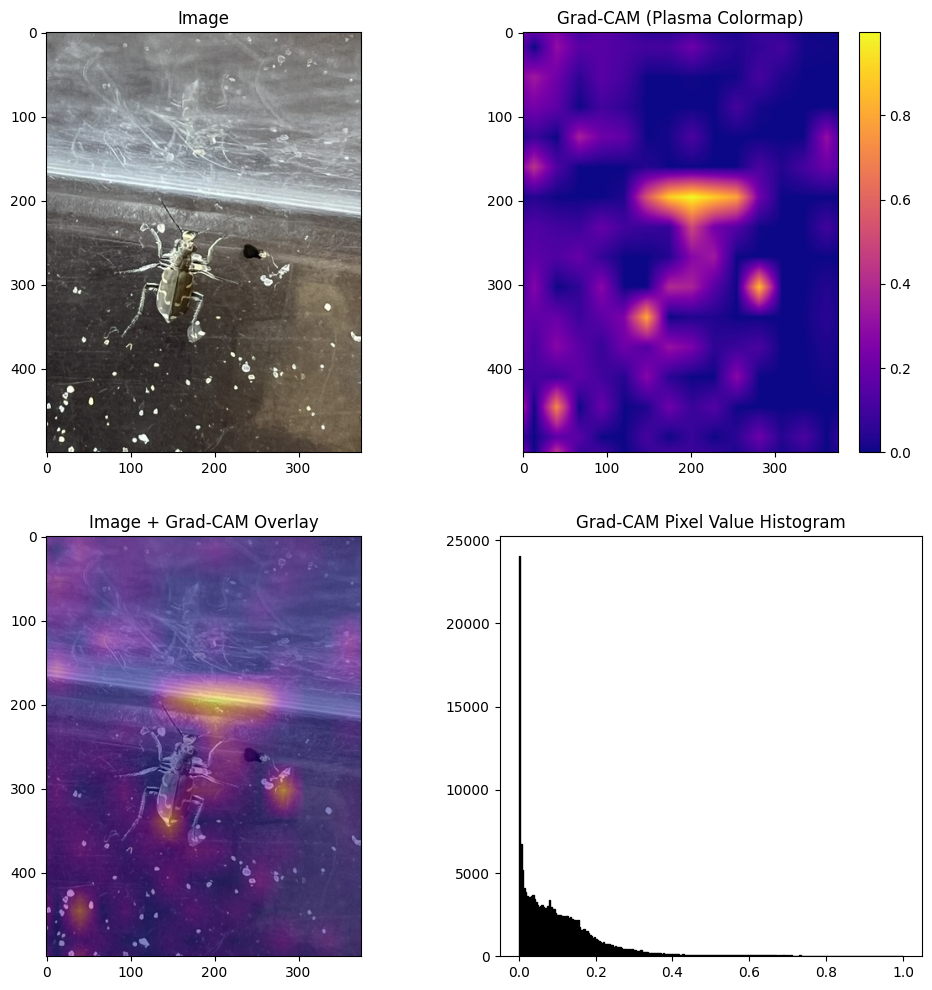



https://www.inaturalist.org/observations/235453611
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Cicindela repanda
BioCLIP family:    Carabidae


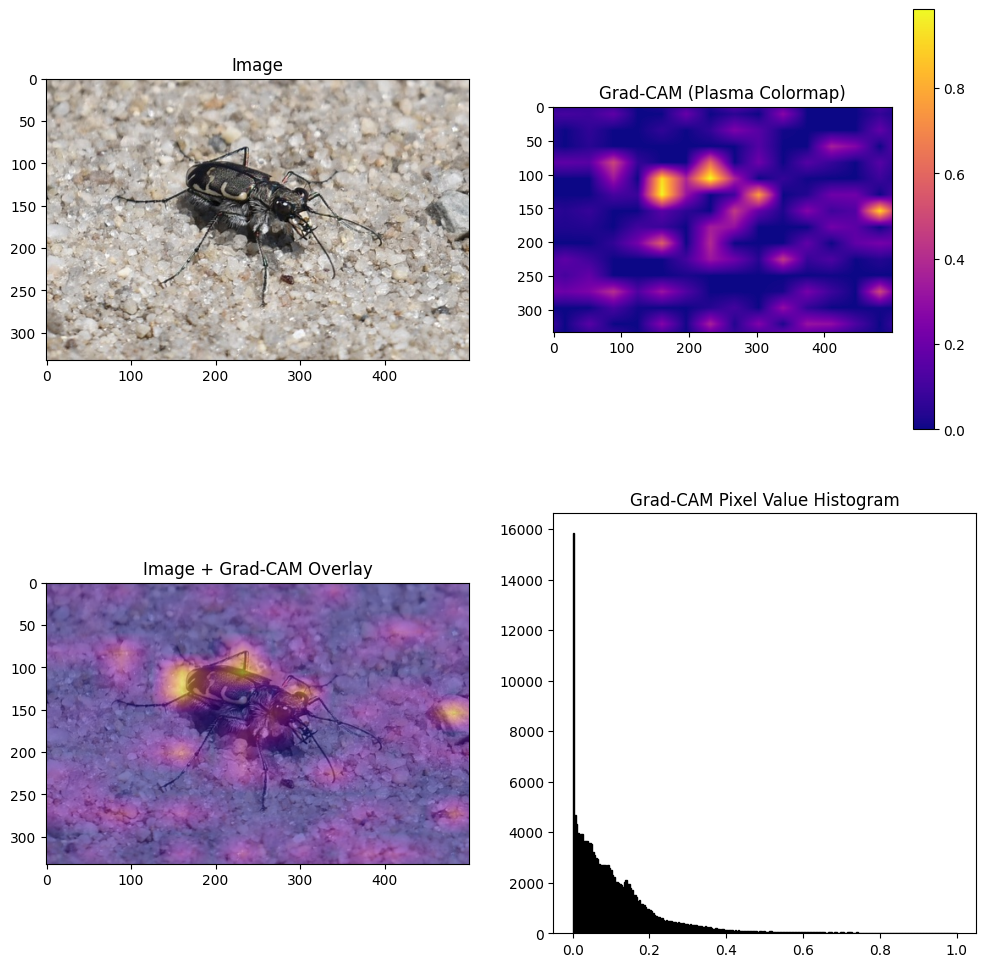



https://www.inaturalist.org/observations/235343264
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Cicindela repanda
BioCLIP family:    Carabidae


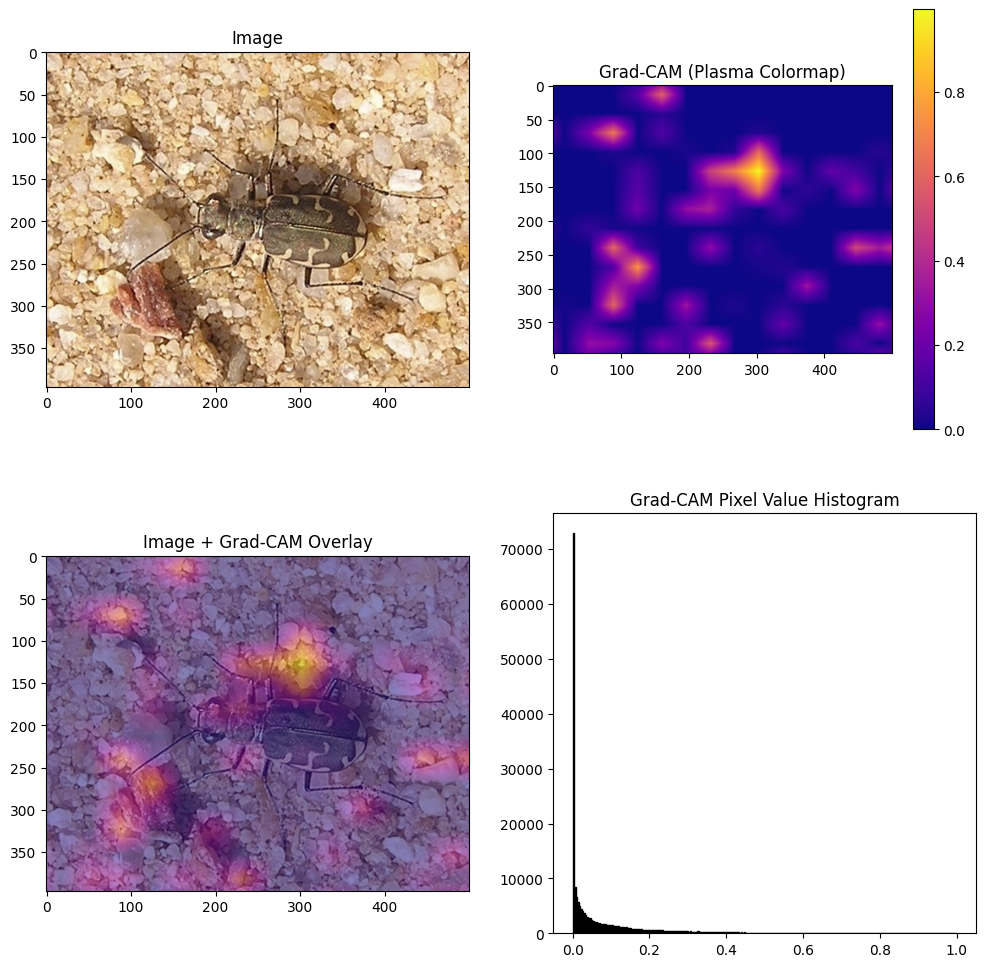



https://www.inaturalist.org/observations/235343260
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Cicindela repanda
BioCLIP family:    Carabidae


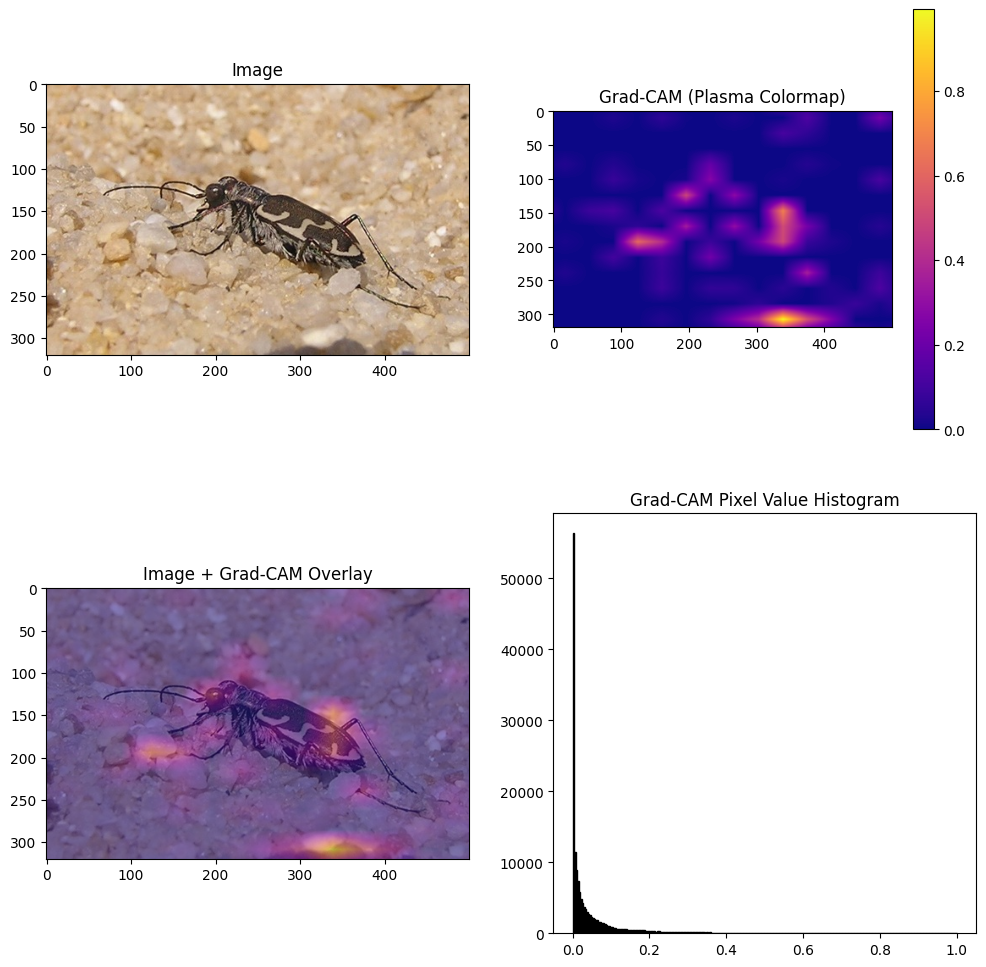



Added new species 'Cicindela longilabris' to index.
https://www.inaturalist.org/observations/235214950
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Cicindela longilabris
BioCLIP family:    Carabidae


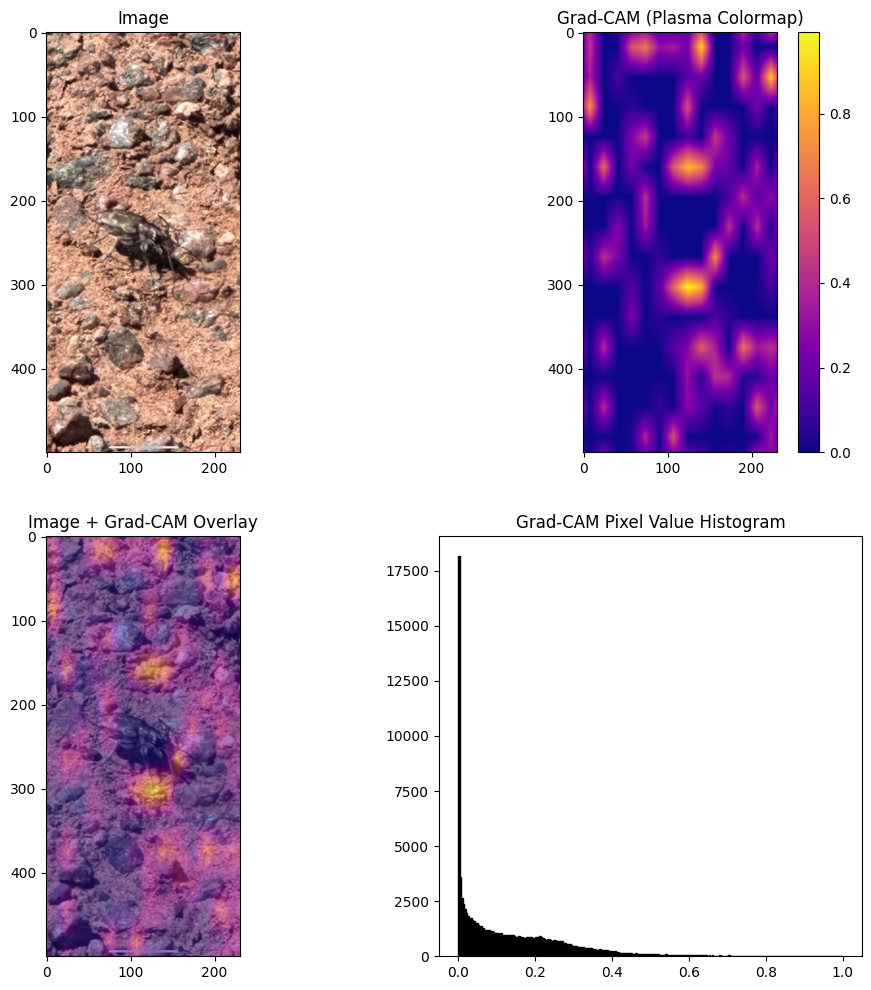



Added new species 'Cicindela obsoleta' to index.
https://www.inaturalist.org/observations/235213512
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Cicindela obsoleta
BioCLIP family:    Carabidae


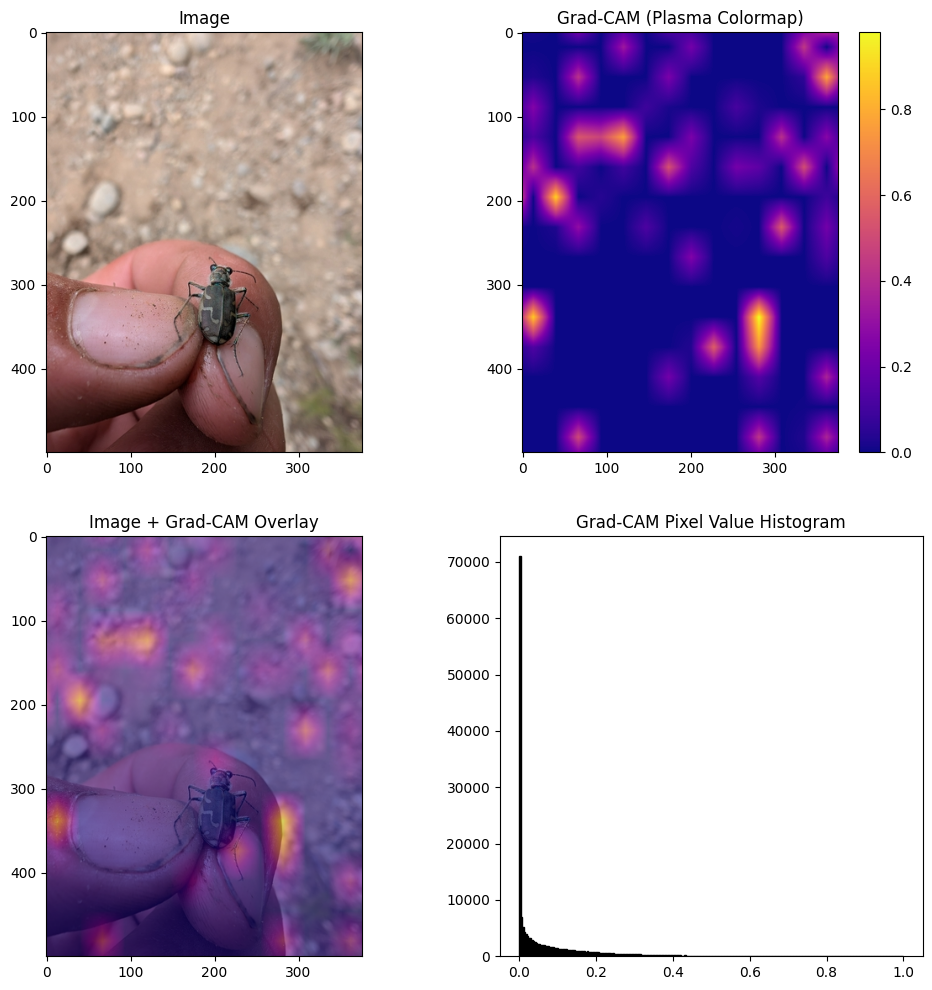



Added new species 'Cicindela nysa' to index.
https://www.inaturalist.org/observations/235192169
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Cicindela nysa
BioCLIP family:    Carabidae


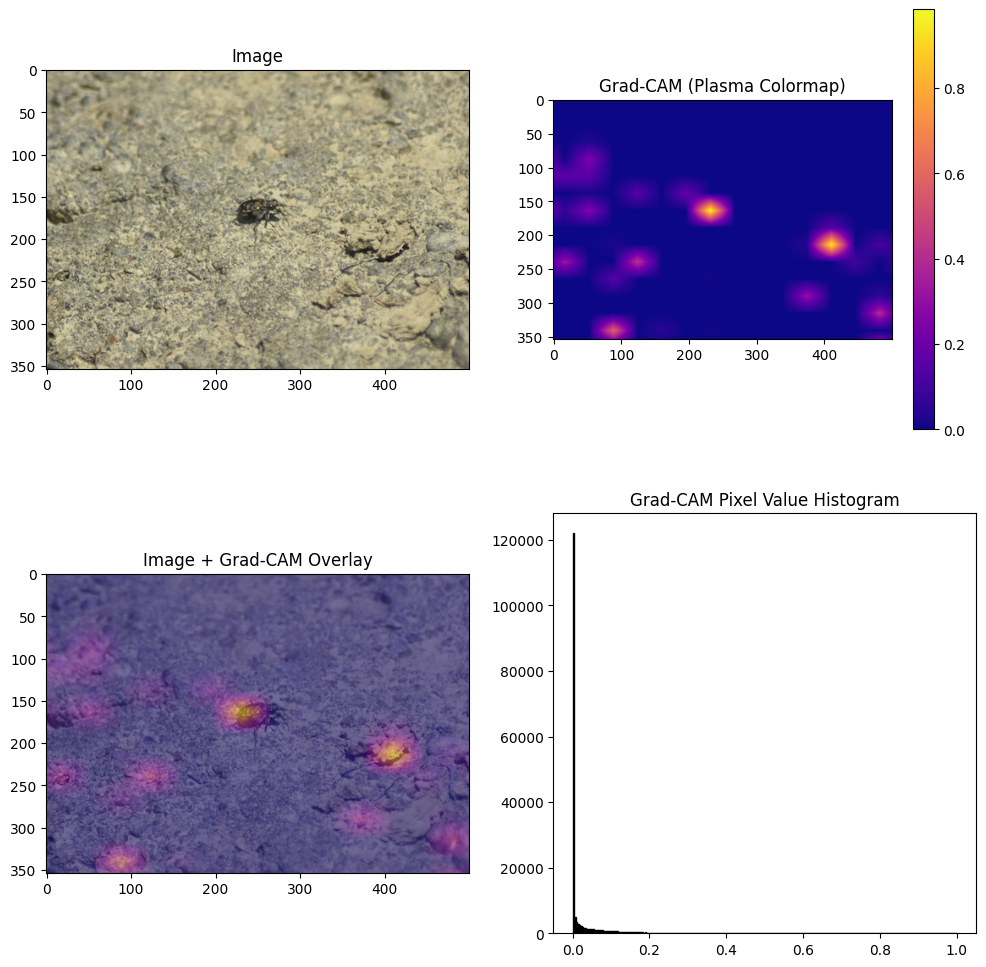



Added new species 'Anoteropsis litoralis' to index.
https://www.inaturalist.org/observations/235170953
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Anoteropsis litoralis
BioCLIP family:    Lycosidae


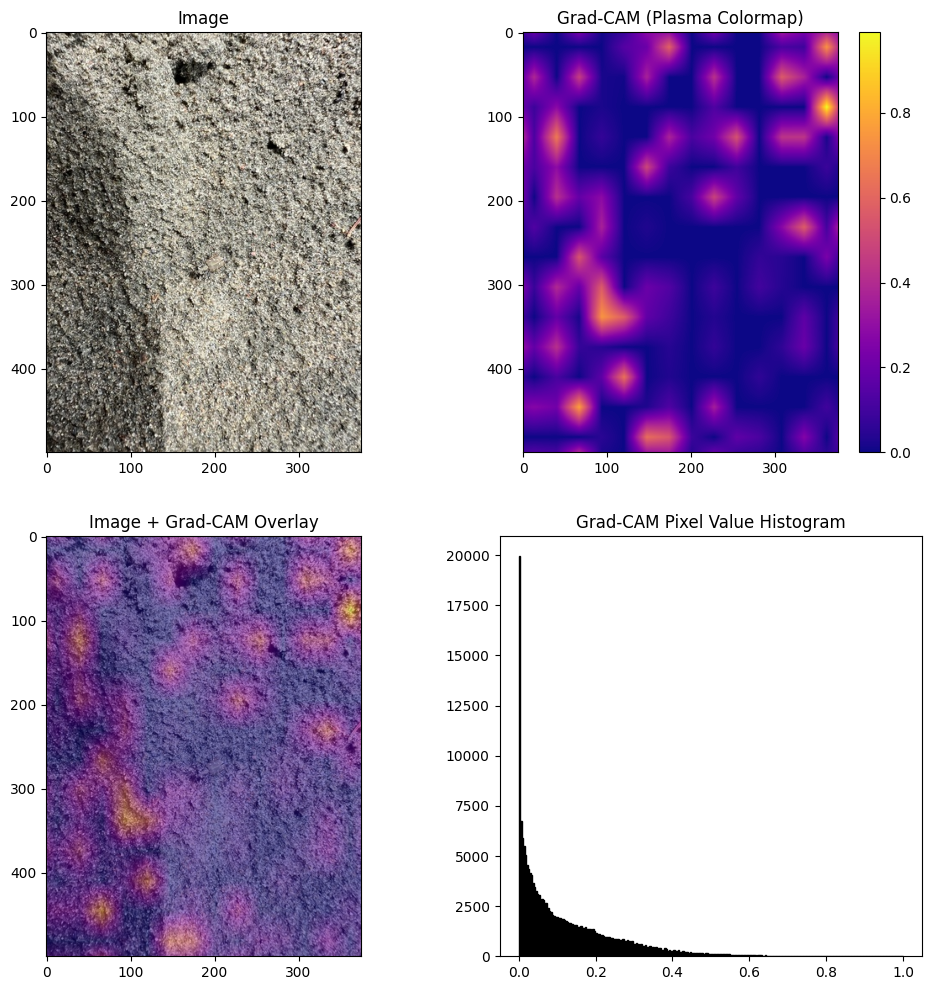



Added new species 'Cylindera shirakii' to index.
https://www.inaturalist.org/observations/235099576
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Cylindera shirakii
BioCLIP family:    Carabidae


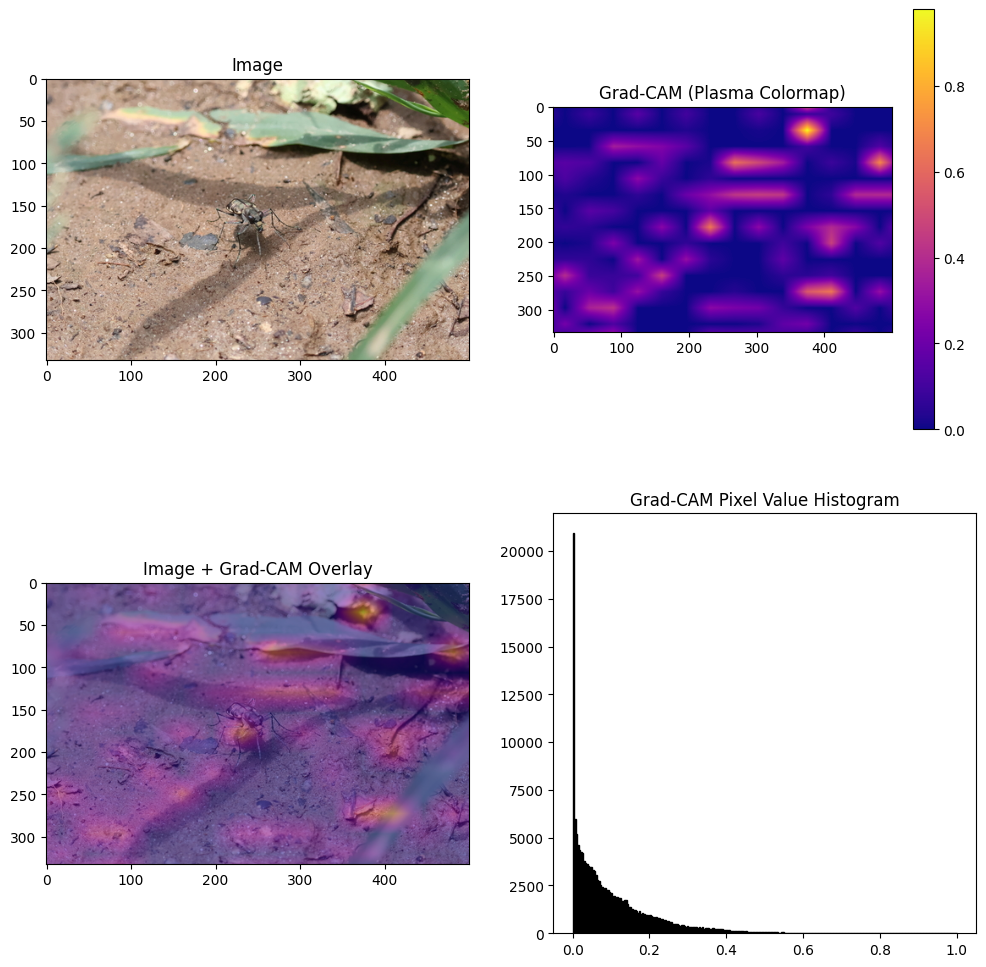



Added new species 'Cicindela gemmata' to index.
https://www.inaturalist.org/observations/234950781
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Cicindela gemmata
BioCLIP family:    Carabidae


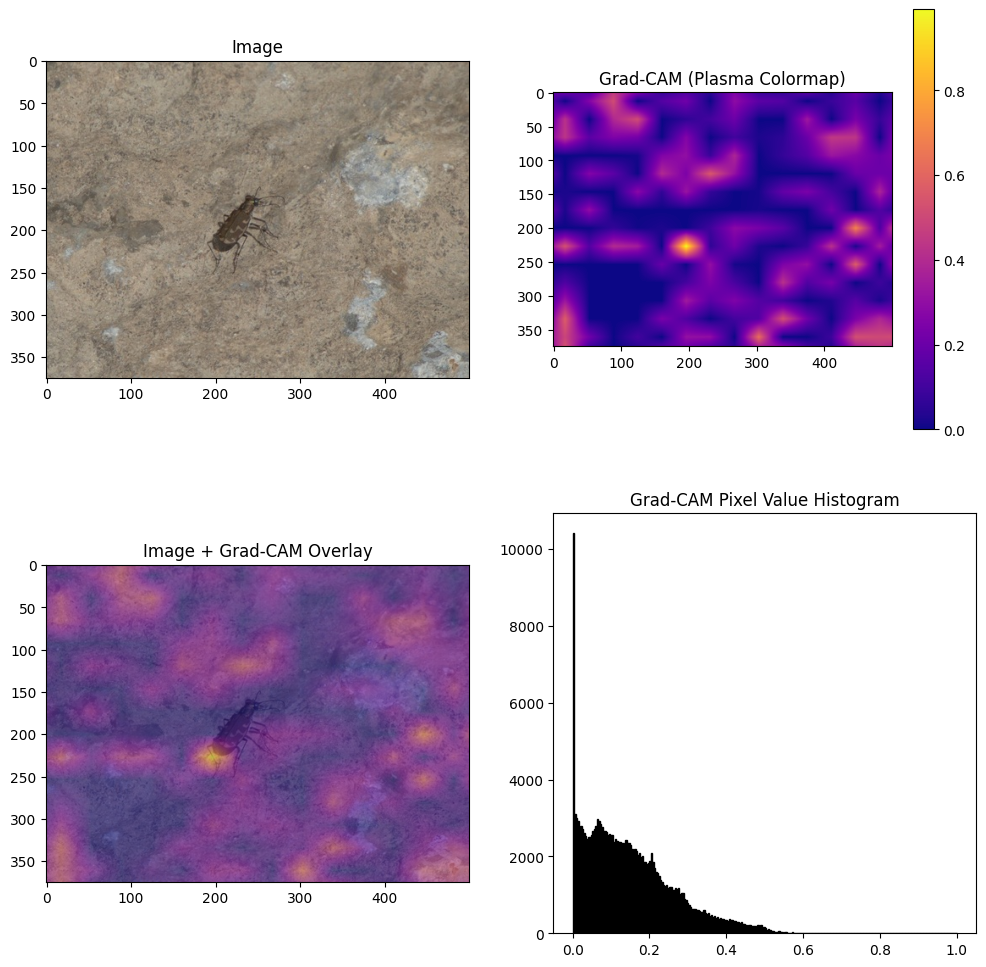



Added new species 'Opilidia macrocnema' to index.
https://www.inaturalist.org/observations/234949427
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Opilidia macrocnema
BioCLIP family:    Carabidae


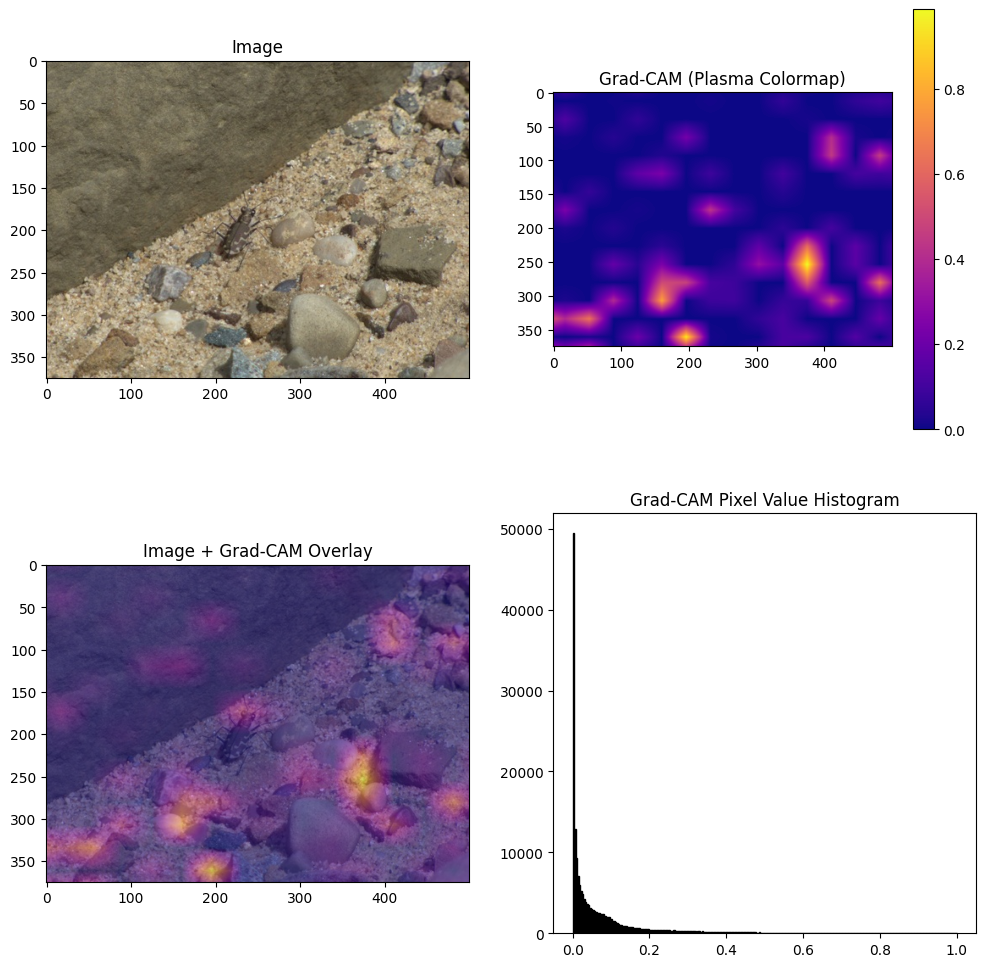



Added new species 'Myriochila specularis' to index.
https://www.inaturalist.org/observations/234790888
iNaturalist taxon: Cicindela repanda
BioCLIP species:   Myriochila specularis
BioCLIP family:    Carabidae


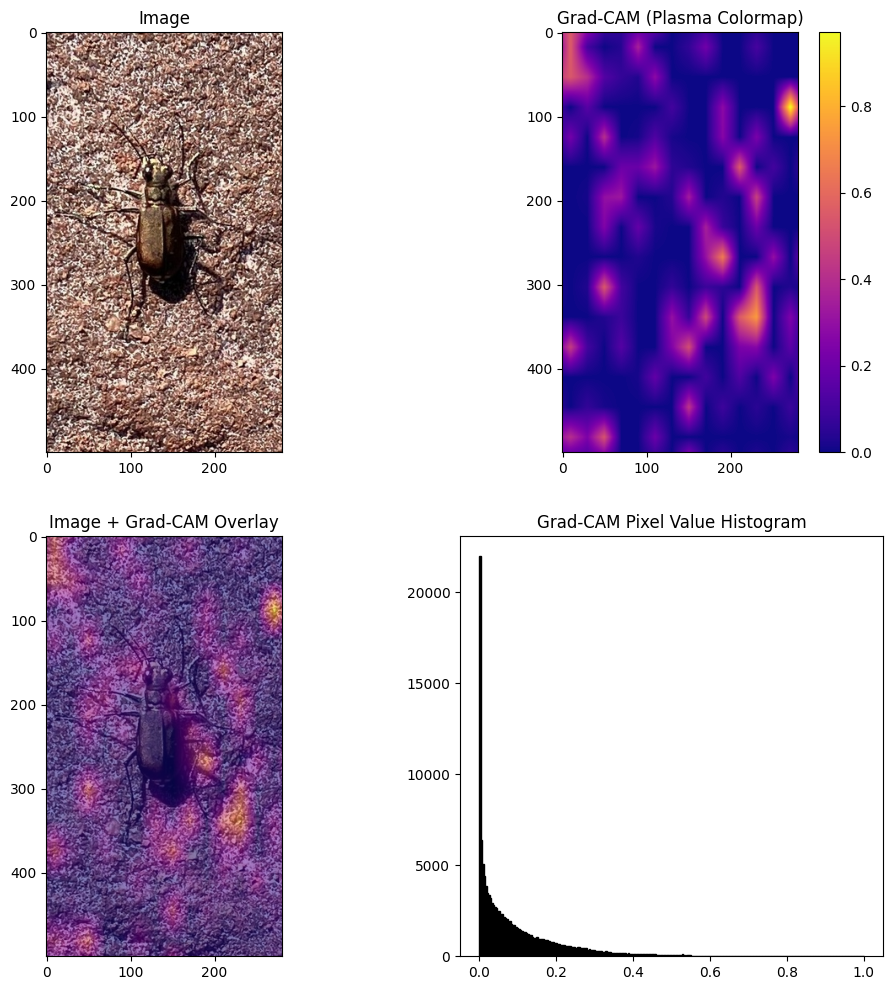

In [ ]:
import os
import pandas as pd
from PIL import Image
import torch
import open_clip
import numpy as np
from skimage.transform import resize
from skimage import exposure
from pyinaturalist import get_observations, Observation
from bioclip import TreeOfLifeClassifier, Rank
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from scipy.stats import pearsonr, spearmanr
import seaborn as sns

# Initialize the model and preprocess functions
model, preprocess_train, preprocess_val = open_clip.create_model_and_transforms('hf-hub:imageomics/bioclip')

# Define the class labels to index (starts with an initial set)
class_labels_to_index = {}


# Fetch observations from iNaturalist
SPECIES = "Cicindela repanda"
IMAGES_DIR = "images"
MAX_IMAGES = 100

response = get_observations(taxon_name=SPECIES, per_page=MAX_IMAGES, has_photos=True)
observations = Observation.from_json_list(response['results'])

# Initialize lists for DataFrame
ids = []
uris = []
paths = []
taxons = []
tensors = []  # To store tensors

# Ensure the images directory exists
os.makedirs(IMAGES_DIR, exist_ok=True)

# Process each observation
for observation in observations:
    if observation.photos:  # Check if photos are available
        path = os.path.join(IMAGES_DIR, f"{observation.id}.jpg")

        # Save the image
        with observation.photos[0].open(size='medium') as infile:
            with open(path, 'wb') as outfile:
                outfile.write(infile.read())

        # Collect metadata
        ids.append(observation.id)
        uris.append(observation.uri)
        paths.append(path)
        taxons.append(observation.taxon.name if observation.taxon else 'Unknown')

        # Load and preprocess the image to tensor
        img = Image.open(path).convert('RGB')  # Ensure image is in RGB format
        tensor = preprocess_train(img).unsqueeze(0)  # Add batch dimension
        tensors.append(tensor)

# Create a DataFrame from the collected data
df = pd.DataFrame({
    'id': ids,
    'uri': uris,
    'path': paths,
    'taxon': taxons
})

# Join tensors with the existing DataFrame
df['tensor'] = tensors

# Initialize the BioCLIP classifier
classifier = TreeOfLifeClassifier()

# Make predictions using BioCLIP
predictions = []
for path in df['path']:
    predictions.extend(classifier.predict(path, Rank.SPECIES, k=1))

# Join predictions with the existing DataFrame
pred_df = df.join(pd.DataFrame(predictions))

# Define Grad-CAM class
class GradCAM:
    def __init__(self, model):
        self.model = model
        self.model.eval()
        self.gradients = None
        self.activations = None

    def save_gradients(self, grad):
        self.gradients = grad

    def get_activations(self, x):
        self.activations = x
        return x

    def forward(self, x):
        # Register hooks
        hooks = []
        def hook_fn(module, input, output):
            self.activations = output
            hooks.append(module.register_forward_hook(hook_fn))

        # Register hook to the last conv layer
        for name, module in self.model.named_modules():
            if isinstance(module, torch.nn.Conv2d):
                hooks.append(module.register_forward_hook(hook_fn))

        x = self.model(x)
        return x

    def generate_cam(self, class_idx):
        # Compute the Grad-CAM map
        grads = self.gradients
        activations = self.activations

        # Pool the gradients across the channels
        weights = torch.mean(grads, dim=[0, 2, 3])
        cam = torch.zeros(activations.shape[2:], dtype=torch.float32)

        for i, w in enumerate(weights):
            cam += w * activations[0, i, :, :]

        # Apply ReLU and normalize
        cam = torch.clamp(cam, min=0)
        cam = cam / torch.max(cam)
        return cam

grad_cam = GradCAM(model.visual)

clustering_metrics = []
high_value_counts = []
correct_predictions = []
for _, row in pred_df.iterrows():
    tensor = row['tensor']
    path = row['path']
    taxon = row['taxon']
    uri = row['uri']
    species = row['species']
    family = row['family']

    try:
        # Automatically add new species to the index if not already present
        if species not in class_labels_to_index:
            class_labels_to_index[species] = len(class_labels_to_index)
            print(f"Added new species '{species}' to index.")

        class_idx = class_labels_to_index[species]

        # Generate Grad-CAM for the specified class index
        tensor.requires_grad_()
        output = grad_cam.forward(tensor)
        output[0, class_idx].backward()
        grad_cam.save_gradients(tensor.grad)
        cam = grad_cam.generate_cam(class_idx)

        # Resize CAM to match the original image size
        img = Image.open(path)
        original_size = img.size
        cam_resized = resize(cam.detach().numpy(), original_size[::-1], mode='reflect', anti_aliasing=True)


        # Convert CAM to color map using a colormap with more color diversity
        cam_colormap = plt.cm.plasma(cam_resized)
        cam_colormap = (cam_colormap[:, :, :3] * 255).astype(np.uint8)  # Remove alpha channel and scale

        # Convert to Image object
        cam_colormap_img = Image.fromarray(cam_colormap)
        cam_colormap_img = cam_colormap_img.resize(original_size, Image.BILINEAR)

        # Overlay Grad-CAM on the original image
        blended = Image.blend(img.convert('RGB'), cam_colormap_img, alpha=0.5)

        # Calculate clustering metric (standard deviation)
        clustering_metric = np.std(cam_resized)
        clustering_metrics.append(clustering_metric)

        # Calculate the quantity of high values within the Grad-CAM image
        high_value_threshold = 0.7  # Threshold for high pixel values
        high_value_count = np.sum(cam_resized >= high_value_threshold)
        high_value_counts.append(high_value_count)

        # Record whether the prediction was correct
        correct_predictions.append(species == taxon)

        # Display results
        print(uri)
        print("iNaturalist taxon:", taxon)
        print("BioCLIP species:  ", species)
        print("BioCLIP family:   ", family)

        plt.figure(figsize=(12, 12))  # Square layout

        plt.subplot(2, 2, 1)
        plt.imshow(img)
        plt.title('Image')

        plt.subplot(2, 2, 2)
        plt.imshow(cam_resized, cmap='plasma', interpolation='bilinear')
        plt.colorbar()
        plt.title('Grad-CAM (Plasma Colormap)')

        plt.subplot(2, 2, 3)
        plt.imshow(blended)
        plt.title('Image + Grad-CAM Overlay')

        plt.subplot(2, 2, 4)
        plt.hist(cam_resized.ravel(), bins=256, range=(0.0, 1.0), fc='black', ec='black')
        plt.title('Grad-CAM Pixel Value Histogram')

        plt.show()
        print("\n")

    except Exception as e:
        print(f"Error processing image {path}: {e}")

# Correlation analysis
correctness_numeric = [1 if x else 0 for x in correct_predictions]

# Ensure all lists are the same length before proceeding
print(f"Clustering metrics length: {len(clustering_metrics)}")
print(f"High-value counts length: {len(high_value_counts)}")
print(f"Correct predictions length: {len(correct_predictions)}")

# If the lists are not the same length, identify the issue
min_length = min(len(clustering_metrics), len(high_value_counts), len(correct_predictions))

# Truncate lists to the same length (if needed)
clustering_metrics = clustering_metrics[:min_length]
high_value_counts = high_value_counts[:min_length]
correctness_numeric = correctness_numeric[:min_length]

# Scatter plot: Prediction correctness vs Clustering metric
plt.figure(figsize=(10, 6))
plt.scatter(clustering_metrics, correctness_numeric, alpha=0.7)
plt.xlabel('Clustering Metric (Standard Deviation)')
plt.ylabel('Prediction Correctness (0=Incorrect, 1=Correct)')
plt.title('Prediction Correctness vs Clustering Metric')
plt.grid(True)
plt.show()

# Scatter plot: Prediction correctness vs High-value pixel count
plt.figure(figsize=(10, 6))
plt.scatter(high_value_counts, correctness_numeric, alpha=0.7)
plt.xlabel('High-Value Pixel Count')
plt.ylabel('Prediction Correctness (0=Incorrect, 1=Correct)')
plt.title('Prediction Correctness vs High-Value Pixel Count')
plt.grid(True)
plt.show()

# Pearson correlation coefficient
pearson_clustering, _ = pearsonr(clustering_metrics, correctness_numeric)
pearson_high_values, _ = pearsonr(high_value_counts, correctness_numeric)

print(f"Pearson correlation between clustering metric and correctness: {pearson_clustering:.3f}")
print(f"Pearson correlation between high-value count and correctness: {pearson_high_values:.3f}")

# Spearman correlation coefficient
spearman_clustering, _ = spearmanr(clustering_metrics, correctness_numeric)
spearman_high_values, _ = spearmanr(high_value_counts, correctness_numeric)

print(f"Spearman correlation between clustering metric and correctness: {spearman_clustering:.3f}")
print(f"Spearman correlation between high-value count and correctness: {spearman_high_values:.3f}")

